In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import os
import cv2
from tqdm import tqdm
IMG_SIZE=200

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
training_data=[]
def train_data():
  label_acne=[1.0,0.0,0.0]
  label_eczema=[0.0,1.0,0.0]
  label_psoriasis=[0.0,0.0,1.0]
  drive_path=['/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Acne','/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Eczema','/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Psoriasis']

  for img in tqdm(os.listdir(drive_path[0])):
    path=os.path.join(drive_path[0],img)
    img=cv2.imread(path,cv2.IMREAD_COLOR)
    img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
    training_data.append([np.array(img),np.array(label_acne)])

  for img in tqdm(os.listdir(drive_path[1])):
    path=os.path.join(drive_path[1],img)
    img=cv2.imread(path,cv2.IMREAD_COLOR)
    img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
    training_data.append([np.array(img),np.array(label_eczema)])

  for img in tqdm(os.listdir(drive_path[2])):
    path=os.path.join(drive_path[2],img)
    img=cv2.imread(path,cv2.IMREAD_COLOR)
    img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
    training_data.append([np.array(img),np.array(label_psoriasis)])    




    

    


In [ ]:
train_data()

100%|██████████| 704/704 [05:00<00:00,  2.35it/s]


In [ ]:
training_data

[[array([[[ 38,  53,  69],
          [ 38,  53,  69],
          [ 38,  53,  69],
          ...,
          [ 86, 108, 149],
          [ 86, 108, 149],
          [ 86, 108, 149]],
  
         [[ 38,  53,  69],
          [ 38,  53,  69],
          [ 38,  53,  69],
          ...,
          [ 86, 108, 149],
          [ 86, 108, 149],
          [ 86, 108, 149]],
  
         [[ 38,  53,  69],
          [ 38,  53,  69],
          [ 38,  52,  69],
          ...,
          [ 85, 107, 148],
          [ 85, 107, 148],
          [ 85, 107, 148]],
  
         ...,
  
         [[  3,   4,   5],
          [  3,   4,   5],
          [  3,   4,   5],
          ...,
          [ 96, 113, 152],
          [ 96, 113, 152],
          [ 96, 113, 152]],
  
         [[  3,   5,   6],
          [  3,   5,   6],
          [  3,   5,   6],
          ...,
          [ 96, 113, 152],
          [ 96, 113, 152],
          [ 96, 113, 152]],
  
         [[  3,   5,   6],
          [  3,   5,   6],
          [  3,   5,   6

In [ ]:
from random import shuffle
shuffle(training_data)
print("lenght of data:",len(training_data))

lenght of data: 2885


In [ ]:
X=np.array([i[0] for i in training_data])
Y=np.array([i[1] for i in training_data])


In [ ]:
print(X.shape,Y.shape)

(2885, 200, 200, 3) (2885, 3)


In [ ]:
X_train=X[:2000]
Y_train=Y[:2000]
X_test=X[2000:]
Y_test=Y[2000:]

print("X_train shape:",X_train.shape)
print("Y_train shape:",Y_train.shape)
print("X_test shape:",X_test.shape)
print("Y_test shape:",Y_test.shape)


X_train shape: (2000, 200, 200, 3)
Y_train shape: (2000, 3)
X_test shape: (885, 200, 200, 3)
Y_test shape: (885, 3)


In [ ]:
#cnn model

def cnn_model():
  model=tf.keras.Sequential([tf.keras.layers.InputLayer((200,200,3)),
                             
                             tf.keras.layers.ZeroPadding2D(padding=(3,3)),

                             tf.keras.layers.Conv2D(filters=32,kernel_size=7,strides=(1,1)),

                             tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001,beta_initializer='zeros', gamma_initializer='ones',moving_mean_initializer='zeros',moving_variance_initializer='ones'),

                             tf.keras.layers.ReLU(),

                             tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2), padding='valid'),

                             tf.keras.layers.Flatten(),

                             tf.keras.layers.Dense(3,activation='softmax'),                             
                             
                             ])
  return model


In [ ]:
conv_model=cnn_model()

In [ ]:
conv_model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
conv_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d (ZeroPadding2 (None, 206, 206, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 200, 200, 32)      4736      
_________________________________________________________________
batch_normalization (BatchNo (None, 200, 200, 32)      128       
_________________________________________________________________
re_lu (ReLU)                 (None, 200, 200, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 100, 100, 32)      0         
_________________________________________________________________
flatten (Flatten)            (None, 320000)            0         
_________________________________________________________________
dense (Dense)                (None, 3)                 9

In [ ]:
conv_model.fit(x=X_train,y=Y_train,epochs=100,validation_data=(X_test,Y_test),batch_size=32)

Epoch 1/100
63/63 [==============================] - 34s 47ms/step - loss: 18.8378 - accuracy: 0.5145 - val_loss: 172.7634 - val_accuracy: 0.2531
Epoch 2/100
63/63 [==============================] - 3s 41ms/step - loss: 10.8005 - accuracy: 0.5905 - val_loss: 30.9321 - val_accuracy: 0.3153
Epoch 3/100
63/63 [==============================] - 3s 41ms/step - loss: 12.7629 - accuracy: 0.5880 - val_loss: 31.9854 - val_accuracy: 0.3424
Epoch 4/100
63/63 [==============================] - 3s 41ms/step - loss: 8.3771 - accuracy: 0.6555 - val_loss: 40.3299 - val_accuracy: 0.5842
Epoch 5/100
63/63 [==============================] - 3s 41ms/step - loss: 10.1639 - accuracy: 0.6515 - val_loss: 19.0635 - val_accuracy: 0.6237
Epoch 6/100
63/63 [==============================] - 3s 41ms/step - loss: 5.0996 - accuracy: 0.7085 - val_loss: 14.0933 - val_accuracy: 0.3977
Epoch 7/100
63/63 [==============================] - 3s 41ms/step - loss: 6.3702 - accuracy: 0.7200 - val_loss: 24.5854 - val_accuracy: 

In [ ]:
conv_model.save('convolution_model.h5')

In [ ]:
conv_model.evaluate(X_test,Y_test)

28/28 [==============================] - 0s 17ms/step - loss: 2.5525 - accuracy: 0.9017


[2.5525176525115967, 0.9016948938369751]

In [ ]:
#DenseNet model

base_model=tf.keras.applications.densenet.DenseNet121(weights=r'imagenet', include_top=False)

x=(base_model.output)

x = tf.keras.layers.GlobalAveragePooling2D()(x)

predictions = tf.keras.layers.Dense(3, activation="sigmoid")(x)

densenet_model = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)


29089792/29084464 [==============================] - 0s 0us/step


In [ ]:
densenet_model.compile(optimizer='adam', loss='CategoricalCrossentropy', metrics=['accuracy'])

In [ ]:
densenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

In [ ]:
densenet_model.fit(x=X_train,y=Y_train,batch_size=32,validation_data=(X_test,Y_test),epochs=50)

Epoch 1/50
63/63 [==============================] - 38s 402ms/step - loss: 0.8940 - accuracy: 0.6345 - val_loss: 80.2362 - val_accuracy: 0.3243
Epoch 2/50
63/63 [==============================] - 20s 322ms/step - loss: 0.6475 - accuracy: 0.7235 - val_loss: 10.0314 - val_accuracy: 0.6000
Epoch 3/50
63/63 [==============================] - 20s 319ms/step - loss: 0.5664 - accuracy: 0.7660 - val_loss: 1.2431 - val_accuracy: 0.6655
Epoch 4/50
63/63 [==============================] - 20s 321ms/step - loss: 0.5035 - accuracy: 0.7875 - val_loss: 1.4111 - val_accuracy: 0.6780
Epoch 5/50
63/63 [==============================] - 20s 323ms/step - loss: 0.4288 - accuracy: 0.8295 - val_loss: 1.4375 - val_accuracy: 0.6316
Epoch 6/50
63/63 [==============================] - 20s 325ms/step - loss: 0.3697 - accuracy: 0.8485 - val_loss: 0.9933 - val_accuracy: 0.6768
Epoch 7/50
63/63 [==============================] - 21s 327ms/step - loss: 0.3914 - accuracy: 0.8520 - val_loss: 2.4747 - val_accuracy: 0.60

In [ ]:
densenet_model.save('DenseNet_model.h5')

In [ ]:
densenet_model.evaluate(X_test,Y_test)

28/28 [==============================] - 2s 82ms/step - loss: 0.7566 - accuracy: 0.8814


[0.7566062211990356, 0.8813559412956238]

In [8]:
def process(path):
  img=cv2.imread(path,cv2.IMREAD_COLOR)
  img=cv2.resize(img,(200,200))
  x=img
  img=np.expand_dims(img,axis=0)
  return img,x

def pred_list(pred):
  pred_list=[]
  for i in pred[0]:
    x=format(i,'.8f')
    pred_list.append(x)
  return pred_list
  
def skindisease(pred_list):
  x=np.argmax(pred_list)
  if x==0:
    print("Disease: Acne")
  elif x==1:
    print("Disease: Eczema")
  elif x==2:
    print("Disease: Psoriasis")

def process_tflite(path):
  img=cv2.imread(path,cv2.IMREAD_COLOR)
  img=cv2.resize(img,(200,200))
  x=img
  img=np.expand_dims(img,axis=0)
  return img,x

['1.00000000', '0.00000000', '0.00000000']
Disease: Acne


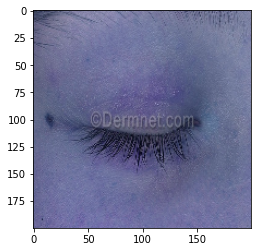

In [ ]:
path='/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Acne/1.jpg'
img,x=process(path)
pred=conv_model.predict(img)
pred_list1=pred_list(pred)
print(pred_list1)
skindisease(pred_list1)
plt.imshow(x)


['0.00000000', '1.00000000', '0.00000000']
Disease: Eczema


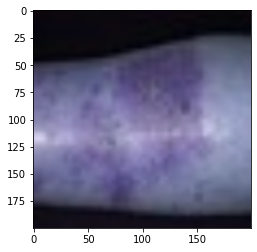

In [ ]:
path='/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Eczema/03DermatitisLeg Eczema_resized.jpg'
img,x=process(path)
pred=conv_model.predict(img)
pred_list1=pred_list(pred)
print(pred_list1)
skindisease(pred_list1)
plt.imshow(x)

['0.00000000', '0.00000023', '0.99999976']
Disease: Psoriasis


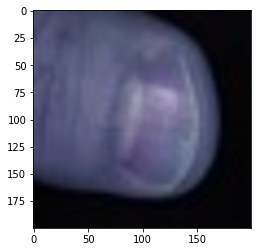

In [ ]:
path='/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Psoriasis/08OilSpotPsoriasis1027 psoriasis_resized.jpg'
img,x=process(path)
pred=conv_model.predict(img)
pred_list1=pred_list(pred)
print(pred_list1)
skindisease(pred_list1)
plt.imshow(x)

In [ ]:
import numpy as np
list=[0,1,8]
print(np.argmax(list))

2


## **Tensorflow model to Tensorflow lite model**

In [ ]:
import tensorflow as tf
model = tf.keras.models.load_model('/content/drive/MyDrive/skindisease model_weights/convolution_model.h5')

In [ ]:
TF_LITE_MODEL_FILE_NAME = "tf_lite_model.tflite"
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = tf_lite_converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmpkbc883cl/assets


In [ ]:
tflite_model_name = TF_LITE_MODEL_FILE_NAME
open(tflite_model_name, "wb").write(tflite_model)

3861444

In [ ]:
tflite_model

b'\x1c\x00\x00\x00TFL3\x14\x00 \x00\x04\x00\x08\x00\x0c\x00\x10\x00\x14\x00\x00\x00\x18\x00\x1c\x00\x14\x00\x00\x00\x03\x00\x00\x00\x18\x00\x00\x000\x00\x00\x00\xc8\x00\x00\x000\x00\x00\x00p\x00\x00\x00h\x00\x00\x00\x06\x00\x00\x00\xac\x05\x00\x00\\\x04\x00\x00\x80\x03\x00\x00\xb8\x02\x00\x00\x08\x02\x00\x00|\x01\x00\x00\x01\x00\x00\x00\xbc\x00\x00\x00\x0f\x00\x00\x00\\\xeb:\x00X\xeb:\x00\\\xea:\x00\xf4\xe9:\x00p\xe9:\x00\x10\xe8:\x00\xc0O\x00\x00\xe4\x05\x00\x00<\xeb:\x008\xeb:\x004\xeb:\x000\xeb:\x00,\xeb:\x00(\xeb:\x00<\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0c\x00\x00\x00\x08\x00\x0c\x00\x04\x00\x08\x00\x08\x00\x00\x00\x08\x00\x00\x00\x0e\x00\x00\x00\x13\x00\x00\x00min_runtime_version\x00\x16\x16\xc5\xff\x04\x00\x00\x00\x10\x00\x00\x001.5.0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00MLIR Converted.\x00\x00\x00\x0e\x00\x18\x00\x04\x00\x08\x00\x0c\x00\x10\x00\x14\x00\x0e\x00\x00\x00\x14\x00\x00\x00H\x00\x00\x00L\x00\x00\x00P\x00\x00\x00h\x00\x00\x00\r\x00\x00\x0

In [5]:
type(tflite_model)

bytes

In [6]:
import numpy as np
import cv2

In [7]:
interpreter = tf.lite.Interpreter(model_path = TF_LITE_MODEL_FILE_NAME)
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input Shape:", input_details[0]['shape'])
print("Input Type:", input_details[0]['dtype'])
print("Output Shape:", output_details[0]['shape'])
print("Output Type:", output_details[0]['dtype'])

Input Shape: [  1 200 200   3]
Input Type: <class 'numpy.float32'>
Output Shape: [1 3]
Output Type: <class 'numpy.float32'>


In [9]:
path='/content/drive/MyDrive/Colab Notebooks/Resized_pictures/Acne/1.jpg'
img,x=process_tflite(path)
img=np.array(img,dtype='float32')
x=np.array(x,dtype='float32')
#test_imgs_numpy = np.array(x, dtype=np.float32)

In [11]:
img.shape,x.shape

((1, 200, 200, 3), (200, 200, 3))

In [17]:
import numpy as np
import tensorflow as tf

# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="/content/tf_lite_model.tflite")

interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test model on random input data.
input_shape = input_details[0]['shape']
input_data = img
interpreter.set_tensor(input_details[0]['index'], input_data)

interpreter.invoke()

# The function `get_tensor()` returns a copy of the tensor data.
# Use `tensor()` in order to get a pointer to the tensor.
output_data = interpreter.get_tensor(output_details[0]['index'])
print(output_data)
skindisease(output_data)

[[1.0000000e+00 5.9443200e-23 3.8853252e-18]]
Disease: Acne


0